# TISSUE application to MERFISH dataset of mouse SVZ to identify neural stem cell lineage subtypes

This notebook contains all code and experiments on the SVZ MERFISH dataset. For differential expression analysis, the code in this notebook relies on the outputs of `get_multi_ttest_external.py` applied to the SVZ dataset for lineage markers and for whole transcriptome using the paired scRNAseq dataset from https://doi.org/10.1038/s43587-022-00335-4. The list of parameters can be found in the job scripts: `run_svz_external_dgea.slurm`, `run_svz_external_dgeall.slurm`, and `run_svz_external_dgeall_ct.slurm`.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
from matplotlib.colors import ListedColormap
import scanpy as sc
import squidpy as sq
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA, NMF
from sklearn.manifold import TSNE
import anndata as ad
import warnings
import time
import pickle
import os

from decimal import Decimal
from statsmodels.stats.multitest import multipletests

from sklearn.metrics import silhouette_score, adjusted_rand_score
from scipy.stats import ttest_rel
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold, cross_val_score, cross_validate
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, average_precision_score
import sklearn.metrics as metrics
from sklearn.decomposition import PCA

from TISSUE.tissue.main import *
from TISSUE.tissue.downstream import *
from TISSUE.tissue.utils import *

## Visualization of the dataset

UMAP and spatial visualizations of key metadata: cell type, left/right, dorsal/ventral locations.

Uses the outputs of the `05_SVZ_MERFISH_initial_process.ipynb` notebook.

In [2]:
adata = sc.read_h5ad("svz_anndata/raw_svz_all.h5ad")

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


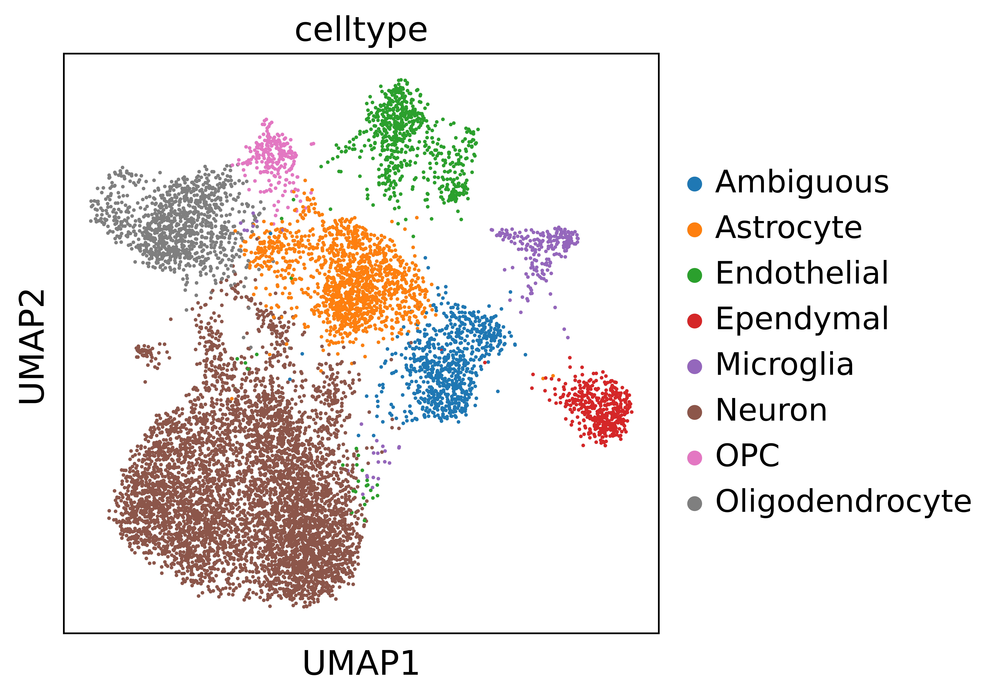

In [3]:
# UMAP visualization of cell types

adata.obs["celltype"] = [x.split("_")[0] if "Ambiguous" in x else x for x in adata.obs.celltype]
sc.set_figure_params(vector_friendly=True, dpi=500, figsize=(5,5), fontsize=16)
sc.pl.umap(adata, color="celltype", show=False)
plt.savefig("plots/SVZ/umap_celltypes_all_initial_merged.pdf", bbox_inches="tight", dpi=300)

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


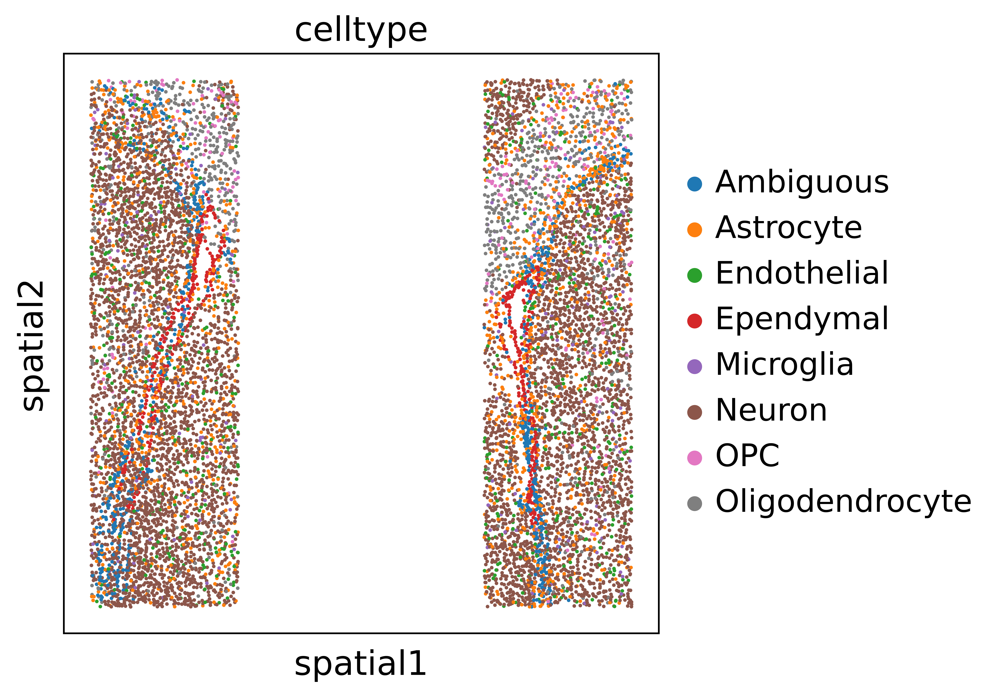

In [4]:
# spatial visualization of cell types

adata.obs["celltype"] = [x.split("_")[0] if "Ambiguous" in x else x for x in adata.obs.celltype]
sc.set_figure_params(vector_friendly=True, dpi=500, figsize=(5,5), fontsize=16)
sc.pl.embedding(adata, "spatial", color="celltype", show=False)
plt.savefig("plots/SVZ/spatial_celltypes_all_initial_merged.pdf", bbox_inches="tight", dpi=300)

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


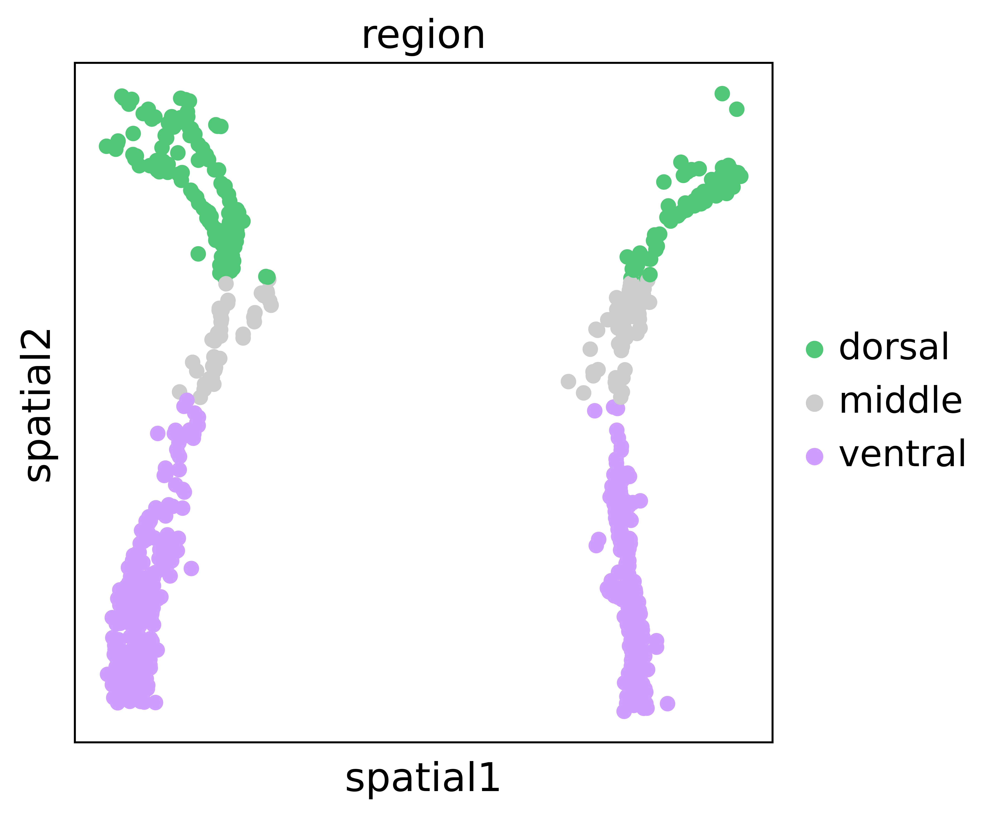

In [5]:
# dorsal/ventral region labels on subsettted spatial plot

adata = sc.read_h5ad("svz_anndata/raw_svz_sub.h5ad")

color_dict = {"dorsal":"#50C878",
              "ventral":"#CF9FFF",
              "middle":"0.8"}
sc.set_figure_params(vector_friendly=True, dpi=500, figsize=(5,5), fontsize=16)
sc.pl.embedding(adata, "spatial", color="region", show=False, palette=color_dict, sort_order=False)
plt.savefig("plots/SVZ/spatial_dorsal_ventral.pdf", bbox_inches="tight", dpi=500)

## NSC lineage subtype identification with TISSUE

Relies on `get_external_multi_ttest.py` outputs for NSC lineage markers (and moved to the appropriate "2023Aug1_k4k1_SDbasedCCPplus1" directory. Launch with Python command and parameters from `run_svz_external_dgea.slurm`.

In [6]:
# Generate dictionary of results from the AnnData objects

condition="celltype"

# read in result anndata
adata = sc.read_h5ad(f'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguous_knn_spage_tangram_MI_EXTERNAL_TTEST.h5ad')

# init dict for stats
combined_stat_result_dict = {}

method = "spage"

# init subdict
combined_stat_result_dict[method] = {}

group1 = np.unique(adata.obs[condition])

# loop through each comparison group
for g1 in group1:

    key = str(g1)+"_all"
    var_key = method+"_"+key
    g1_bool = (adata.obs[condition] == g1) # g1
    g2_bool = (adata.obs[condition] != g1) # all other

    combined_stat_result_dict[method][key] = {}
    combined_stat_result_dict[method][key]["gene"] = adata.uns[var_key+"_pvalue"].columns

    # add TISSUE statistics from uns
    combined_stat_result_dict[method][key]["mi_pvalue"] = adata.uns[var_key+"_pvalue"].values
    combined_stat_result_dict[method][key]["mi_tstat"] = adata.uns[var_key+"_tstat"].values

    # compute baseline statistics
    tt, pp = two_sample_ttest(adata.obsm[method+"_predicted_expression"][combined_stat_result_dict[method][key]["gene"]].values,
                              g1_bool, g2_bool)
    combined_stat_result_dict[method][key]["imp_pvalue"] = pp
    combined_stat_result_dict[method][key]["imp_tstat"] = tt

# pickle dict
# with open(f"results/hypothesis_testing/SVZmerfish_subambiguous_external.pkl", "wb") as f:
#     pickle.dump(combined_stat_result_dict, f)

In [2]:
with open(f"results/hypothesis_testing/SVZmerfish_subambiguous_external.pkl", "rb") as f:
    combined_stat_result_dict = pickle.load(f)

In [3]:
# compile TISSUE MI t-test statistics
target_genes = np.genfromtxt("../SpatialAging/pilot_data_analysis/tissue_results/lineage_marker_genes.txt", dtype=str)

group_col = []
method_col = []
gene_col = []
tstat_diff_col = []
tstat_mi_col = []
tstat_imp_col = []
pval_diff_col = []
p_val_imp = []
p_val_mi = []

method = "spage"
for group1 in combined_stat_result_dict[method].keys():

    # subset genes
    genes = combined_stat_result_dict[method][group1]["gene"]
    target_bools = np.isin(genes, target_genes)

    # compute diffs
    diffs = np.abs(combined_stat_result_dict[method][group1]["mi_tstat"]-combined_stat_result_dict[method][group1]["imp_tstat"])
    pdiffs = np.abs(combined_stat_result_dict[method][group1]["mi_pvalue"]-combined_stat_result_dict[method][group1]["imp_pvalue"])

    # add results
    method_col.append([method]*np.sum(target_bools))
    group_col.append([group1]*np.sum(target_bools))
    gene_col.append(genes[target_bools])
    tstat_diff_col.append(diffs.flatten()[target_bools])
    tstat_mi_col.append(combined_stat_result_dict[method][group1]["mi_tstat"].flatten()[target_bools])
    tstat_imp_col.append(combined_stat_result_dict[method][group1]["imp_tstat"].flatten()[target_bools])
    pval_diff_col.append(pdiffs.flatten()[target_bools])

    p_val_imp.append(combined_stat_result_dict[method][group1]["imp_pvalue"].flatten()[target_bools])
    p_val_mi.append(combined_stat_result_dict[method][group1]["mi_pvalue"].flatten()[target_bools])

group_col = np.concatenate(group_col)
method_col = np.concatenate(method_col)
gene_col = np.concatenate(gene_col)
tstat_diff_col = np.concatenate(tstat_diff_col)
tstat_mi_col = np.concatenate(tstat_mi_col)
tstat_imp_col = np.concatenate(tstat_imp_col)
pval_diff_col = np.concatenate(pval_diff_col)
p_val_imp = np.concatenate(p_val_imp)
p_val_mi = np.concatenate(p_val_mi)

res_df = pd.DataFrame([])
res_df["group"] = group_col
res_df["gene"] = gene_col
res_df["method"] = method_col
res_df["abs_tstat_diff"] = tstat_diff_col
res_df["tstat_mi"] = tstat_mi_col
res_df["tstat_imp"] = tstat_imp_col
res_df["abs_pval_diff"] = pval_diff_col
res_df["p_val_imp"] = p_val_imp
res_df["p_val_mi"] = p_val_mi

In [4]:
res_df = res_df.loc[res_df["group"].isin(["Ambiguous_1_all",
                                          "Ambiguous_2_all",
                                          "Ambiguous_3_all"]),:]
res_df

,group,gene,method,abs_tstat_diff,tstat_mi,tstat_imp,abs_pval_diff,p_val_imp,p_val_mi
0,Ambiguous_1_all,aqp4,spage,4.306069,-4.415022,-8.721091,0.000011,0.000000e+00,0.000011
1,Ambiguous_1_all,aldh1l1,spage,6.558692,-2.307986,-8.866679,0.021432,0.000000e+00,0.021432
2,Ambiguous_1_all,prom1,spage,3.705016,-1.127399,-4.832415,0.260207,1.627486e-06,0.260209
3,Ambiguous_1_all,slc1a3,spage,6.831302,-3.752175,-10.583476,0.000196,0.000000e+00,0.000196
4,Ambiguous_1_all,nr2e1,spage,8.618289,-2.276695,-10.894984,0.023207,0.000000e+00,0.023207
...,...,...,...,...,...,...,...,...,...
61,Ambiguous_3_all,stmn2,spage,5.189357,-1.080782,-6.270139,0.280344,5.999496e-10,0.280344
62,Ambiguous_3_all,dlx6os1,spage,5.525262,-0.934667,-6.459929,0.350604,1.853153e-10,0.350604
63,Ambiguous_3_all,igfbpl1,spage,5.922595,-1.103299,-7.025895,0.270407,4.675815e-12,0.270407
64,Ambiguous_3_all,sox11,spage,6.582898,-1.174292,-7.757190,0.241010,2.753353e-14,0.241010


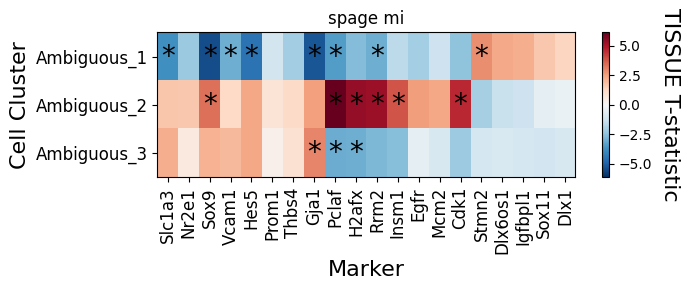

In [5]:
qNSC_aNSC_markers = ['Slc1a3','Nr2e1','Sox9','Vcam1','Hes5','Prom1',
                     'Thbs4','Gja1']
aNSC_NPC_markers = ['Pclaf', 'H2afx', 'Rrm2', 'Insm1', 'Egfr',
                    'Mcm2', 'Cdk1']
Neuroblast_markers = ['Stmn2', 'Dlx6os1', 'Igfbpl1', 'Sox11','Dlx1']

markers_list = np.concatenate([qNSC_aNSC_markers,aNSC_NPC_markers,Neuroblast_markers])

p_cutoff = 0.1



##################

method = "spage"

subdf = res_df[res_df["method"]==method]
result_rows_mi = []
result_rows_mi_pval = []

# for each group and marker, add the t-stat to the corresponding row
for group in np.unique(res_df['group']):
    groupdf = subdf[subdf["group"] == group]
    group_mi = []
    for marker in markers_list:
        if marker.lower() in np.unique(groupdf['gene']):
            group_mi.append(groupdf[groupdf["gene"]==marker.lower()]["tstat_mi"].values[0])
    result_rows_mi.append(group_mi)


# for each group and marker, add the p-value to the corresponding row
for group in np.unique(res_df['group']):
    groupdf = subdf[subdf["group"] == group]
    group_mi = []
    for marker in markers_list:
        if marker.lower() in np.unique(groupdf['gene']):
            group_mi.append(groupdf[groupdf["gene"]==marker.lower()]["p_val_mi"].values[0])
    result_rows_mi_pval.append(group_mi)


# make heatmap plots of the -log 10 pvalues
xticklabels = [x for x in markers_list if x.lower() in np.unique(subdf['gene'])]
yticklabels = [x.split("_all")[0] for x in np.unique(res_df['group'])]

plt.figure(figsize=(7,3))
plt.title(method+" mi")
maxlim = np.max(np.abs(np.vstack(result_rows_mi)))
plt.imshow(np.vstack(result_rows_mi), aspect='auto', cmap="RdBu_r", vmin=-maxlim, vmax=maxlim)
plt.xticks(np.arange(len(xticklabels)), xticklabels, fontsize=12, rotation=90)
plt.yticks(np.arange(len(yticklabels)), yticklabels, fontsize=12)
cbar = plt.colorbar()
cbar.ax.set_ylabel('TISSUE T-statistic', rotation=270, fontsize=16, labelpad=20)
sig_mask = np.vstack([["*" if x < (p_cutoff/len(xticklabels)) else "" for x in row] for row in result_rows_mi_pval])
for i in range(len(yticklabels)):
    for j in range(len(xticklabels)):
        text = plt.text(j, i, sig_mask[i, j],
                       ha="center", va="center", color="k", fontsize=20)
plt.xlabel("Marker", fontsize=16)
plt.ylabel("Cell Cluster", fontsize=16)
plt.tight_layout()
plt.savefig(f"plots/SVZ/DGEA_celltype_heatmap_MI_{method}.pdf", bbox_inches="tight")
plt.show()

In [6]:
# show table of p-values for each marker in the second subcluster
res_df[(res_df["group"]=="Ambiguous_2_all")&(res_df["gene"].isin([x.lower() for x in qNSC_aNSC_markers+aNSC_NPC_markers]))][["gene","p_val_imp","p_val_mi"]]

,gene,p_val_imp,p_val_mi
24,prom1,3.438806e-04,3.980153e-01
25,slc1a3,1.402396e-06,9.314251e-02
26,nr2e1,8.437695e-15,9.619605e-02
27,sox9,5.830976e-10,7.631654e-04
28,vcam1,1.379745e-03,2.239009e-01
29,hes5,6.873910e-07,1.818693e-02
30,thbs4,2.333950e-05,2.450173e-01
31,gja1,1.053697e-05,1.127722e-02
32,pclaf,0.000000e+00,1.201319e-09
33,h2afx,0.000000e+00,9.175655e-08


In [7]:
p_cutoff/len(xticklabels)

0.005

In [8]:
# identified subtypes mapper
lineage_mapper = {"Ambiguous_1": "Neuroblast",
                  "Ambiguous_2": "aNSC/NPC",
                  "Ambiguous_3": "qNSC",}

# save final cell type assignments
adata = sc.read_h5ad(f'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguous_knn_spage_tangram_MI_EXTERNAL_TTEST.h5ad')

adata.obs["celltype"] = [lineage_mapper[x] if x in lineage_mapper.keys() else x for x in adata.obs.celltype]
adata.write_h5ad(f'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguous_knn_spage_tangram_MI_EXTERNAL_TTEST_identified.h5ad')

## Lineage proportions across ventricles

Check proportion of each subtype across the left and right ventricles

In [9]:
# read in data
adata = sc.read_h5ad(f'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguous_knn_spage_tangram_MI_EXTERNAL_TTEST_identified.h5ad')

In [10]:
# compute proportions for the two ventricles
celltypes = []
ventricles = []
proportions = []

vent_mapper = {"left":"Left Ventricle", "right":"Right Ventricle"}

# loop subtype and ventricle to compute proportions
for ct in np.unique(adata.obs.celltype):
    for vent in np.unique(adata.obs.ventricle):
        sub_adata = adata[adata.obs.ventricle==vent]
        celltypes.append(ct)
        ventricles.append(vent_mapper[vent])
        proportions.append(np.sum(sub_adata.obs.celltype==ct)/sub_adata.shape[0])

# compile dataframe of proportions
df = pd.DataFrame(np.vstack([celltypes,ventricles,proportions]).T,
                  columns=["Cell Type", "Ventricle", "Proportion"])
df["Proportion"] = df["Proportion"].astype(float)

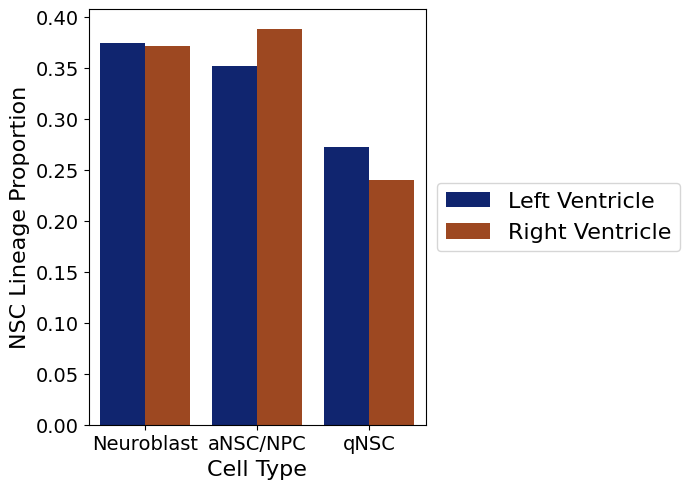

In [11]:
# make barplot of lineage proportions split by ventricle

plt.figure(figsize=(7,5))
sns.barplot(data=df, x="Cell Type", y="Proportion", hue="Ventricle", palette='dark')
plt.xlabel("Cell Type", fontsize=16)
plt.ylabel("NSC Lineage Proportion", fontsize=16)
plt.legend(fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=16, ncol=1)
plt.tight_layout()
plt.savefig('plots/SVZ/proportions_ventricles.pdf', dpi=300, bbox_inches='tight')
plt.show()

### Compare to cell type distributions in scRNAseq atlases

Compare the proportions of aNSC/NPC and Neuroblast to existing single-cell RNAseq datasets of the mouse SVZ (Liu et al., 2023; Buckley et al., 2023; Dulken et al., 2019) as validation for correct subtype identification in the MERFISH dataset.

NOTE: We removed the qNSC label since in these datasets, they are intermixed with astrocytes under Astrocyte_qNSC and the relative proportion will reflect the dissection procedure rather than actual biological proportions of the SVZ

In [2]:
# Buckley et al. (2023)
fn = "Buckley_Metadata.txt"

df = pd.read_csv(os.path.join("results/svz",fn))

# subset into young animals < 6mo
df = df[df["Age"]<6]

# subset into NSC lineage cell types
df = df[df["Celltype.LowRes"].isin(["aNSC_NPC","Neuroblast"])] # "Astrocyte_qNSC"

buckley_celltypes = df["Celltype.LowRes"].values.copy()

In [3]:
# Dulken et al. (2019)
fn = "Dulken_Metadata.txt"

df = pd.read_csv(os.path.join("results/svz",fn))

# subset into young animals
df = df[df["Age"]=="y"]

# subset into NSC lineage cell types
df = df[df["Celltype"].isin(["aNSCs_NPCs","Neuroblasts"])] # "Astrocytes_qNSCs"
mapper = {"aNSCs_NPCs":"aNSC_NPC",
          "Astrocytes_qNSCs":"Astrocyte_qNSC",
          "Neuroblasts":"Neuroblast"}

dulken_celltypes = np.array([mapper[x] for x in df["Celltype"].values])

In [4]:
# Liu et al. (2023)
fn = "LiuExercise_Metadata.txt"

df = pd.read_csv(os.path.join("results/svz",fn))

# subset into young animals (control group)
df = df[df["AgeCond"]=="Y_Control"]

# subset into NSC lineage cell types
df = df[df["Celltype.LowRes"].isin(["aNSC_NPC","Neuroblast"])]

liu_celltypes = df["Celltype.LowRes"].values.copy()

In [6]:
# load MERFISH data and combine into Astrocyte_qNSC label
adata = sc.read_h5ad("svz_anndata/raw_svz_all.h5ad")

lineage_mapper = {"Ambiguous_1": "Neuroblast",
                  "Ambiguous_2": "aNSC_NPC",
                  "Ambiguous_3": "Astrocyte_qNSC",
                  "Astrocyte": "Astrocyte_qNSC",}

adata.obs["celltype"] = [lineage_mapper[x] if x in list(lineage_mapper.keys()) else x for x in adata.obs.celltype]
adata = adata[adata.obs.celltype.isin(["Neuroblast","aNSC_NPC"]),:]

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [16]:
# Compute proportions

celltypes = []
datasets = []
proportions = []

# MERFISH data
for ct in np.unique(adata.obs.celltype):
    celltypes.append(ct)
    datasets.append("MERFISH")
    proportions.append(np.sum(adata.obs.celltype==ct)/adata.shape[0])

# scRNAseq data
for ct in np.unique(buckley_celltypes):
    celltypes.append(ct)
    datasets.append("Buckley et al.\n(2023)")
    proportions.append(np.sum(buckley_celltypes==ct)/len(buckley_celltypes))
for ct in np.unique(dulken_celltypes):
    celltypes.append(ct)
    datasets.append("Dulken et al.\n(2019)")
    proportions.append(np.sum(dulken_celltypes==ct)/len(dulken_celltypes))
for ct in np.unique(liu_celltypes):
    celltypes.append(ct)
    datasets.append("Liu et al.\n(2023)")
    proportions.append(np.sum(liu_celltypes==ct)/len(liu_celltypes))
    
df = pd.DataFrame(np.vstack([celltypes,datasets,proportions]).T,
                  columns=["Cell Type", "Dataset", "Proportion"])
df["Proportion"] = df["Proportion"].astype(float)

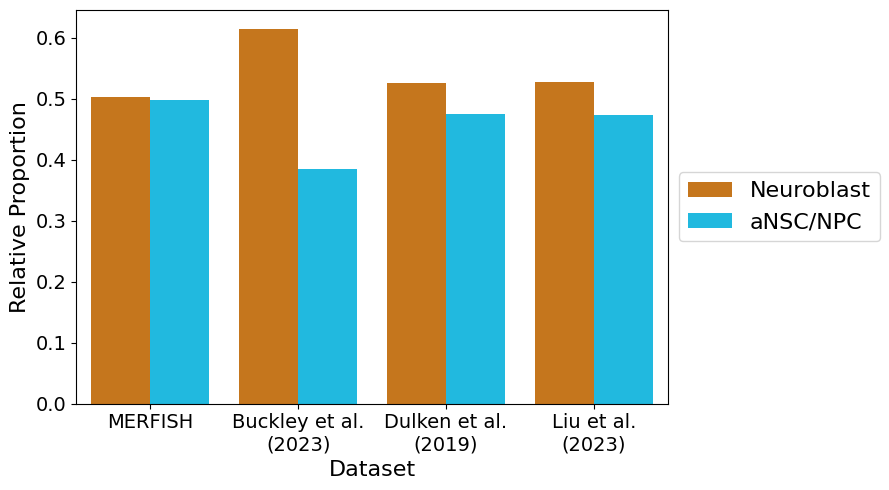

In [17]:
# Make plots

sub_df = df[df["Cell Type"]!="Astrocyte_qNSC"]
mapper = {"Neuroblast":"Neuroblast","aNSC_NPC":"aNSC/NPC"}
sub_df["Cell Type"] = [mapper[x] for x in sub_df["Cell Type"]]
sub_df["Cell Type"] = sub_df["Cell Type"].astype('category').cat.set_categories(["Neuroblast", "aNSC/NPC"])
colors = ['xkcd:pumpkin', "xkcd:bright sky blue"]

plt.figure(figsize=(9,5))
sns.barplot(data=sub_df, x="Dataset", y="Proportion", hue="Cell Type", palette=colors)
plt.xlabel("Dataset", fontsize=16)
plt.ylabel("Relative Proportion", fontsize=16)
plt.legend(fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=16, ncol=1)
plt.tight_layout()
plt.savefig('plots/SVZ/dataset_proportions_noAstroqNSC.pdf', bbox_inches='tight')
plt.show()

## Spatial location of subtypes

Make spatial plots of the ambiguous cell cluster before and after the TISSUE-based identification of subtypes

In [2]:
adata = sc.read_h5ad(f'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguous_knn_spage_tangram_MI_EXTERNAL_TTEST_identified.h5ad')
adata.obsm["spatial"][:,1] = -adata.obsm["spatial"][:,1]

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


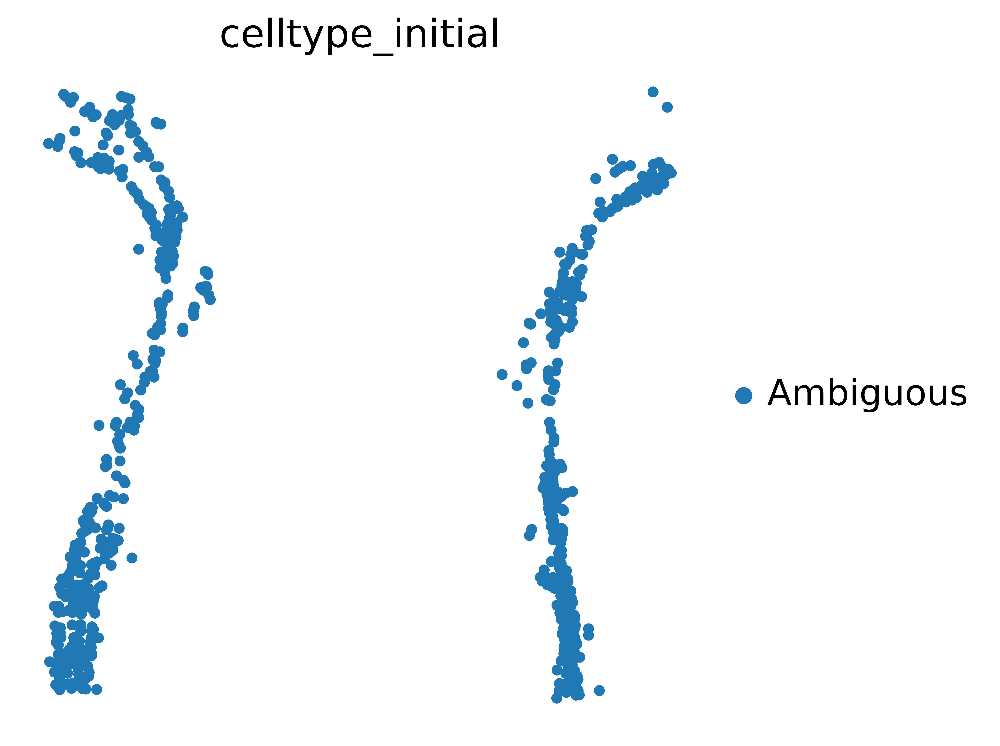

In [3]:
adata.obs["celltype_initial"] = "Ambiguous"

sc.set_figure_params(vector_friendly=True, dpi=500, figsize=(5,5), fontsize=16)
sc.pl.embedding(adata, "spatial", color="celltype_initial", size=80, show=False)
plt.axis('off')
plt.savefig("plots/SVZ/spatial_ambiguous.pdf", bbox_inches="tight", dpi=300)

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


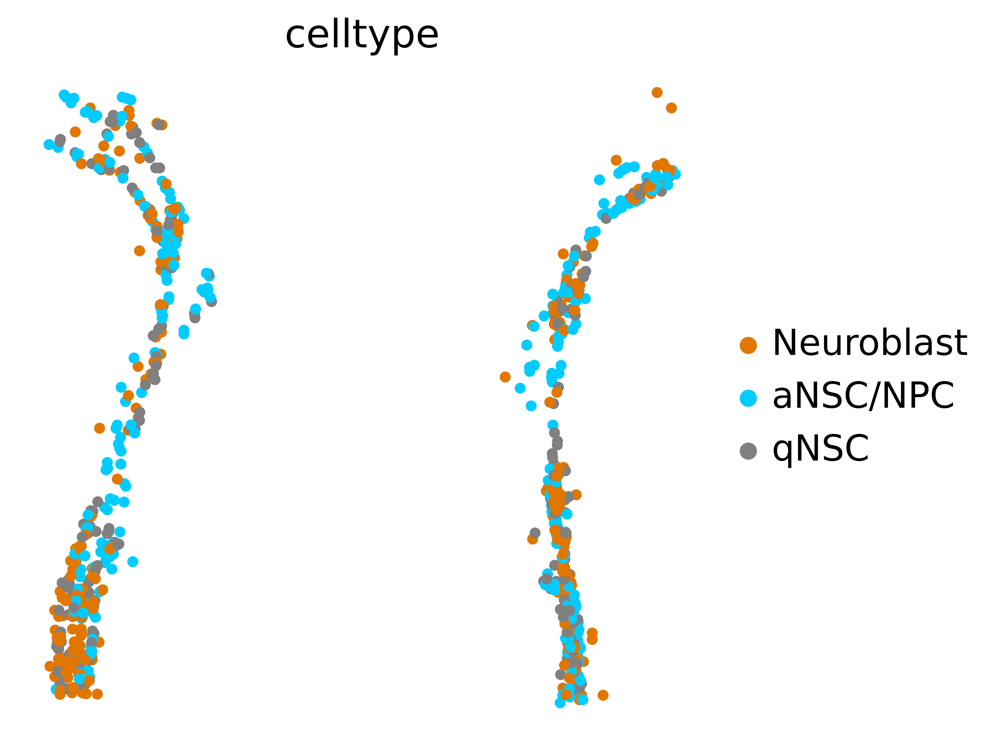

In [24]:
colors = ['xkcd:pumpkin', "xkcd:bright sky blue", 'grey']

sc.set_figure_params(vector_friendly=True, dpi=500, figsize=(5,5), fontsize=16)
sc.pl.embedding(adata, "spatial", color="celltype", palette=colors, size=80, show=False)
plt.axis('off')
plt.savefig("plots/SVZ/spatial_celltypes_lineage.pdf", bbox_inches="tight", dpi=300)

## Save cell type and region labels for whole-transcriptome DGEA

Converts the mapped AnnData object to the `SVZsubambiguousidentified` folder for TISSUE whole-transcriptome prediction and testing via `get_external_dgea_multi_ttest.py` using the parameters of `run_svz_external_dgeall_ct.slurm`.

In [10]:
# function for converting anndata to DataUpload format

def convert_adata_to_dataupload (adata, savedir):
    
    locations = pd.DataFrame(adata.obsm['spatial'], columns=['x','y'])
    locations.to_csv(os.path.join(savedir,"Locations.txt"), sep="\t", index=False)
    
    df = pd.DataFrame(adata.X, columns=adata.var_names)
    df.to_csv(os.path.join(savedir,"Spatial_count.txt"), sep="\t", index=False)
    
    meta = pd.DataFrame(adata.obs)
    meta.to_csv(os.path.join(savedir,"Metadata.txt"))

In [ ]:
# read in results from previous code
adata = sc.read_h5ad(f'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguous_knn_spage_tangram_MI_EXTERNAL_TTEST_identified.h5ad')

In [ ]:
# read in the raw anndata from before
adata2 = sc.read_h5ad("svz_anndata/raw_svz_sub.h5ad")

In [ ]:
# construct a celltype_region label for further TISSUE MI testing
adata.obs["region"] = adata2.obs["region"].values
adata.obs["celltype_region"] = adata.obs["celltype"].astype(str)+adata.obs["region"].astype(str)
adata.obs["celltype_region"] = adata.obs["celltype_region"].astype('category')

In [30]:
# convert to DataUpload format to run with get_external_multi_ttest.py for whole transcriptome imputation
convert_adata_to_dataupload(adata, "svz_anndata/SVZsubambiguousidentified")

## SVZ heterogeneity DGEA analysis

Compiles the results of differential gene expression analysis at whole-transcriptome level between celltype-region labels. Uses the outputs from `get_external_dgea_multi_ttest.py` using the parameters of `run_svz_external_dgeall_ct.slurm`.

In [36]:
# read in results from whole-transcriptome imputation
adata_ansc = large_load('scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguousidentified_knn_spage_tangram_MI_EXTERNAL_TTEST_celltype_region_aNSCdorsal')
adata_qnsc = large_load('scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguousidentified_knn_spage_tangram_MI_EXTERNAL_TTEST_celltype_region_qNSCdorsal')
adata_neuroblast = large_load('scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguousidentified_knn_spage_tangram_MI_EXTERNAL_TTEST_celltype_region_Neuroblastdorsal')

In [37]:
# combine into one adata by mapping uns keys
adata = adata_ansc.copy()

for key in adata_qnsc.uns.keys():
    adata.uns[key] = adata_qnsc.uns[key]
    
for key in adata_neuroblast.uns.keys():
    adata.uns[key] = adata_neuroblast.uns[key]
    
del adata_ansc
del adata_qnsc
del adata_neuroblast

In [14]:
# Parameter settings 

method = "spage"
condition = "celltype_region"
group1s = ["qNSCdorsal", "aNSCdorsal", "Neuroblastdorsal"]
group2s = ["qNSCventral", "aNSCventral", "Neuroblastventral"]
labels = ["qNSC", "aNSC", "Neuroblast"]


# Compute log2FC
#----------------------------------------
for i in range(len(group1s)):
    
    group1 = group1s[i]
    group2 = group2s[i]
    
    # get group1 and group2 mean expression
    g1_mean_exp = adata.obsm[f'{method}_predicted_expression'].values[adata.obs[condition]==group1,:].mean(axis=0)
    if group2 == "all":
        g2_mean_exp = adata.obsm[f'{method}_predicted_expression'].values[adata.obs[condition]!=group1,:].mean(axis=0)
    else:
        g2_mean_exp = adata.obsm[f'{method}_predicted_expression'].values[adata.obs[condition]==group2,:].mean(axis=0)

    # compute log2fc expression    
    adata.uns[f"{method}_{group1}_{group2}_log2fc"] = pd.DataFrame(np.log2(g1_mean_exp/g2_mean_exp),index=adata.obsm[f'{method}_predicted_expression'].columns)

/tmp/ipykernel_139/525884251.py:25: RuntimeWarning: divide by zero encountered in log2
  adata.uns[f"{method}_{group1}_{group2}_log2fc"] = pd.DataFrame(np.log2(g1_mean_exp/g2_mean_exp),index=adata.obsm[f'{method}_predicted_expression'].columns)


In [5]:
# save anndata object
large_save(adata,'scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguousidentified_knn_spage_tangram_MI_EXTERNAL_TTEST_celltype_region_COMBINED')

## SVZ heterogeneity prediction

Uses the output of the previous section to train TISSUE-filtered classifiers for predicting regional origin of cells (ventral vs dorsal) and benchmark against a baseline classifier without TISSUE filtering.

In [18]:
adata = large_load('scg_results/scpi/2023Aug1_k4k1_SDbasedCCPplus1/SVZsubambiguousidentified_knn_spage_tangram_MI_EXTERNAL_TTEST_celltype_region_COMBINED')

In [19]:
# filter to binary classes
adata = adata[(adata.obs.region.isin(["dorsal","ventral"]))]

In [20]:
k = 20
celltypes = ["qNSC","aNSC","Neuroblast"]
group1s = ["qNSCdorsal", "aNSCdorsal", "Neuroblastdorsal"]
group2s = ["qNSCventral", "aNSCventral", "Neuroblastventral"]
method = "knn"
condition = "region"

#-------------------------------------------------------------
predicted = f"{method}_predicted_expression"
gene_features = [] # get smallest k p-value genes for each
for i in range(len(group1s)):
    group1 = group1s[i]
    group2 = group2s[i]
    if k is not None:
        idxs = np.argpartition(adata.uns[f"{method}_{group1}_{group2}_pvalue"].values, k)[0][:k]
        gene_features.append(adata.uns[f"{method}_{group1}_{group2}_pvalue"].columns.values.flatten()[idxs].copy())
    else:
        gene_features.append(adata.uns[f"{method}_{group1}_{group2}_pvalue"].columns.values.flatten())

In [21]:
# build prediction intervals
conformalize_prediction_interval(adata, predicted, adata.var_names.copy(), alpha_level=0.33)

/home/edsun/anaconda3/envs/geneimputation/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [22]:
# Run classification experiment for each cell type and make ROC plots

stats_dict = {}
stats_dict["celltype"] = []
stats_dict["approach"] = []
stats_dict["f1"] = []
stats_dict["accuracy"] = []
stats_dict["roc_auc"] = []
stats_dict["avg_prec"] = []


for ci, celltype in enumerate(celltypes):
    
    features = gene_features[ci]
    
    # Set up X, y, cross-validation splits
    kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=444)
    X = adata.obsm[predicted][features].values[adata.obs.celltype==celltype,:]
    y = np.array(adata.obs[condition][adata.obs.celltype==celltype].astype(str))
    pi_widths = (adata.obsm[f'{predicted}_hi'][features].values - adata.obsm[f'{predicted}_lo'][features].values)[adata.obs.celltype==celltype,:]
    splits = kf.split(X, y)

    # Run training and cross-validation evaluation
    y_all = []
    pred_y_all = []
    pred_y_filtered = []
    y_filtered = []

    for i, (train_index, test_index) in enumerate(splits):

        # get train test
        X_train = X[train_index,:].copy()
        X_train_pi_width = pi_widths[train_index,:]
        y_train = y[train_index]
        X_test = X[test_index,:].copy()
        X_test_pi_width = pi_widths[test_index,:]
        y_test = y[test_index]
        
        # filter both independently
        keep_idxs_train = detect_uncertain_cells (X_train_pi_width, proportion="otsu", stratification=y_train)
        keep_idxs_test = detect_uncertain_cells (X_test_pi_width, proportion="otsu", stratification=y_test)

        # fit model (baseline)
        model = LogisticRegression(penalty='l1', solver='liblinear')#, tol=1e-3, max_iter=500)
        scaler = StandardScaler()
        model.fit(scaler.fit_transform(X_train), y_train)
        
        # fit model (TISSUE)
        model_filtered = LogisticRegression(penalty='l1', solver='liblinear')#, tol=1e-3, max_iter=500)
        scaler = StandardScaler()
        model_filtered.fit(scaler.fit_transform(X_train[keep_idxs_train,:]), y_train[keep_idxs_train])
        
        # evaluate
        pred_y_test_scores = model.predict_proba(scaler.transform(X_test))
        pred_y_test_scores_filtered = model_filtered.predict_proba(scaler.transform(X_test[keep_idxs_test,:]))

        # add results
        pred_y_all = np.concatenate((pred_y_all,pred_y_test_scores[:,0]))
        y_all = np.concatenate((y_all,y_test))
        pred_y_filtered = np.concatenate((pred_y_filtered,pred_y_test_scores_filtered[:,0]))
        y_filtered = np.concatenate((y_filtered,y[test_index[keep_idxs_test]]))

    # dict for mapping integer class labels
    label_mapper = {np.unique(adata.obs[condition])[0]: 0,
                    np.unique(adata.obs[condition])[1]: 1}
    # get mapped labels
    y_all = np.array([label_mapper[yi] for yi in y_all])
    y_filtered = np.array([label_mapper[yi] for yi in y_filtered])
    
    # compute metrics

    stats_dict["celltype"]+=[celltype,celltype]
    stats_dict["approach"]+=["tissue","baseline"]
    stats_dict["f1"]+=[metrics.f1_score(y_filtered, 1-np.rint(pred_y_filtered)),
                             metrics.f1_score(y_all, 1-np.rint(pred_y_all))]
    stats_dict["accuracy"]+=[metrics.accuracy_score(y_filtered, 1-np.rint(pred_y_filtered)),
                                  metrics.accuracy_score(y_all, 1-np.rint(pred_y_all))]
    stats_dict["roc_auc"]+=[metrics.roc_auc_score(y_filtered, pred_y_filtered),
                                 metrics.roc_auc_score(y_all, pred_y_all)]
    stats_dict["avg_prec"]+=[metrics.average_precision_score(y_filtered, pred_y_filtered),
                                   metrics.average_precision_score(y_all, pred_y_all)]

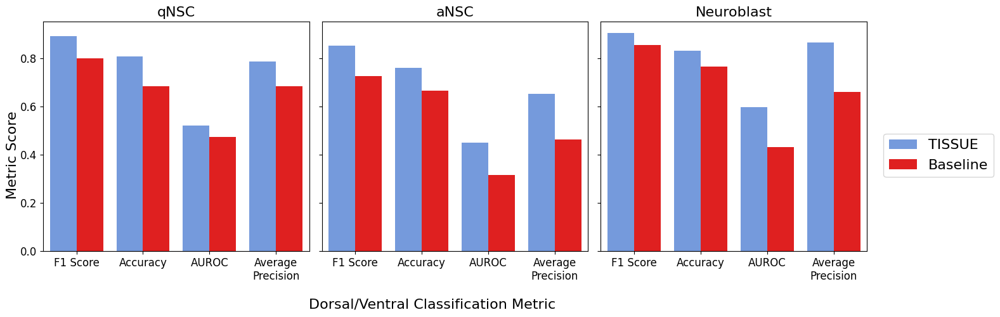

In [23]:
metric_mapper = {"f1":"F1 Score","accuracy":"Accuracy","roc_auc":"AUROC",
                 "avg_prec":"Average\nPrecision"}
approach_mapper = {"tissue":"TISSUE","baseline":"Baseline"}

df = pd.DataFrame(stats_dict)


# Make plot
fig, axs = plt.subplots(nrows=1, ncols=len(group1s), sharex=True, sharey=True, figsize=(14, 5))

for i, celltype in enumerate(["qNSC","aNSC","Neuroblast"]):
    sub_df = df[df['celltype']==celltype]
    sub_df = pd.melt(sub_df, id_vars=["celltype","approach"], value_vars=["f1","accuracy","roc_auc","avg_prec"])
    
    sub_df["variable"] = [metric_mapper[x] for x in sub_df["variable"]]
    sub_df["approach"] = [approach_mapper[x] for x in sub_df["approach"]]
    
    # bar plot
    g = sns.barplot(sub_df, x="variable", y="value", hue="approach", palette=["cornflowerblue","r"], ax = axs[i])
    g.legend_.remove()
    
    # label plot
    axs[i].set_title(celltype,fontsize=16)
    axs[i].tick_params(axis='both', which='major', labelsize=12)
    axs[i].tick_params(axis='both', which='minor', labelsize=12)
    axs[i].set_ylabel("")
    axs[i].set_xlabel("")
    
# Make plot
fig.supxlabel("Dorsal/Ventral Classification Metric", fontsize=16)
fig.supylabel("Metric Score", fontsize=16)
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=16)
plt.tight_layout()
plt.savefig('plots/SVZ/classification_metrics_plots.pdf', bbox_inches='tight')
plt.show()